<center>
    <font size="5" color="steelblue"><b>Universidad Nacional de Colombia</b></font><br>
    <font size="5" color="steelblue"><b>Unidad de Informática - Facultad de Ciencias Económicas</b></font><br>
    <font size="5" color="steelblue"><b>Curso Libre Machine Learning con Python | 2023-1</b></font><br>
    <font size="5" color="steelblue"><b>Semana 2: Análisis Exploratorio de Datos</b></font><br>
    <font size="5" color="steelblue"><b>Estudiante Auxiliar: Jaime Andrés Fierro Aponte</b></font><br>
</center>

# Dependencias

In [2]:
# Manejo de datos
import pandas as pd
import numpy as np

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns

# # Conexión con Drive
# from google.colab import drive

In [ ]:
# # Establecer la conexión con mi drive
# drive.mount('/content/drive')

# Datos

El conjunto de datos recupera información sobre los clientes de un banco. Éstos datos fueron construídos para el análisis sobre la cancelación de productos creditios por parte de algunos clientes. Las variables disponibles son las siguientes:

* **CLIENTNUM**: Número de cliente. Identificador único del cliente titular de la cuenta
* **Attrition_Flag**: Actividad del cliente - Cliente que abandonó o cliente que aún existe
* **Customer_Age**: Variable demográfica - Edad del cliente en años
* **Gender**: Variable demográfica - M=Male, F=Female
* **Dependent_count**: Variable demográfica - Número de dependientes
* **Education_Level**: Variable demográfica**: Nivel educativo - Nivel educativo del titular de la cuenta (high school, college graduate, etc.)
* **Marital_Status**: Variable demográfica**: Estado civil - Married, Single, Divorced, Unknow
* **Income**: Variable demográfica**: Ingreso - Ingreso anual del titular de la cuenta
* **Card_Category**: Varible del producto - Tipo de la tarjeta (Blue, Silver, Gold, Platinum)
* **Months_on_book**: Periodo de relación con el banco
* **Total_Relationship_Count**: Número total de productos obtenidos por el cliente
* **Months_Inactive_12_mon**: Número de meses inactivo en los últimos 12 meses
* **Contacts_Count_12_mon**: Número de contactos en los últimos 12 meses
* **Credit_Limit**: Límite de crédito en la tarjeta de crédito
* **Total_Revolving_Bal**: Saldo rotatorio total en la tarjeta de crédito
* **Avg_Open_To_Buy**: Línea de crédito abierta para comprar (promedio de los últimos 12 meses)
* **Total_Amt_Chng_Q4_Q1**: Cambio en el monto de la transacción (Q4 sobre Q1)
* **Total_Trans_Amt**: Monto total de transacción (últimos 12 meses)
* **Total_Trans_Ct**: Cantidad total de transacciones (últimos 12 meses)
* **Total_Ct_Chng_Q4_Q1**: Cambio en la cantidad total de transacciones (Q4 sobre Q1)
* **Avg_Utilization_Ratio**: Ratio de uso promedio de la tarjeta

In [3]:
# Importar los datos
bank_attrited = pd.read_excel('../data/Bank Attrited Customers.xlsx')
bank_attrited

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,70376.50,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42.0,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,20006.60,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33.0,3.714,0.105
2,713982108,Existing Customer,51,NaN,3,Graduate,Married,111901.58,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20.0,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,25607.43,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20.0,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,66669.58,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28.0,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10139,772366833,Existing Customer,50,M,2,Graduate,Single,45227.76,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117.0,0.857,0.462
10140,710638233,Attrited Customer,41,M,2,NaN,Divorced,40187.47,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69.0,0.683,0.511
10141,716506083,Attrited Customer,44,F,1,High School,Married,416.97,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60.0,0.818,0.000
10142,717406983,Attrited Customer,30,M,2,Graduate,NaN,44482.74,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62.0,0.722,0.000


## Exploración Inicial

In [4]:
# Tipo de objeto
type(bank_attrited)

pandas.core.frame.DataFrame

In [5]:
# Tipo de datos por variable
bank_attrited.dtypes

CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income                      float64
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct              float64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

In [6]:
# Dimensiones
bank_attrited.shape

(10144, 21)

In [7]:
# Conteo de datos nulos
bank_attrited.isna().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                        42
Dependent_count                0
Education_Level             1521
Marital_Status               750
Income                      1115
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                  17
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct               198
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [8]:
# Información general
bank_attrited.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10144 entries, 0 to 10143
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10144 non-null  int64  
 1   Attrition_Flag            10144 non-null  object 
 2   Customer_Age              10144 non-null  int64  
 3   Gender                    10102 non-null  object 
 4   Dependent_count           10144 non-null  int64  
 5   Education_Level           8623 non-null   object 
 6   Marital_Status            9394 non-null   object 
 7   Income                    9029 non-null   float64
 8   Card_Category             10144 non-null  object 
 9   Months_on_book            10144 non-null  int64  
 10  Total_Relationship_Count  10144 non-null  int64  
 11  Months_Inactive_12_mon    10144 non-null  int64  
 12  Contacts_Count_12_mon     10144 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [9]:
# Eliminar variable identificadora
datos = bank_attrited.copy()
datos.drop(columns='CLIENTNUM', inplace=True)

# Medidas Univariadas

In [10]:
# Resumen descriptivo para variables numéricas
descriptiva = datos.describe()
descriptiva

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10144.000000,10144.000000,9029.000000,10144.000000,10144.000000,10144.000000,10144.000000,10127.000000,10144.000000,10144.000000,10144.000000,10144.000000,9946.000000,10144.000000,10144.000000
mean,46.322752,2.346609,93325.617031,35.924487,3.812401,2.341483,2.456033,8631.875294,1162.909799,7471.533034,0.759986,4404.199625,64.743414,0.712076,0.274806
std,8.015804,1.298697,165421.878809,7.987754,1.554238,1.010889,1.106317,9088.521307,815.156610,9091.746865,0.219205,3398.469966,23.478140,0.238064,0.275682
min,26.000000,0.000000,0.860000,12.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,26062.140000,31.000000,3.000000,2.000000,2.000000,2555.000000,357.000000,1325.750000,0.631000,2154.750000,45.000000,0.581000,0.023000
50%,46.000000,2.000000,50405.640000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.500000,3475.500000,0.736000,3898.000000,67.000000,0.702000,0.175000
75%,52.000000,3.000000,80150.360000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9861.750000,0.859000,4741.000000,81.000000,0.818000,0.502250
max,73.000000,5.000000,998717.740000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


### Análisis de frecuencia

#### Deserción

In [11]:
datos['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    8511
Attrited Customer    1633
Name: count, dtype: int64

In [12]:
datos['Attrition_Flag'].value_counts(normalize=True)

Attrition_Flag
Existing Customer    0.839018
Attrited Customer    0.160982
Name: proportion, dtype: float64

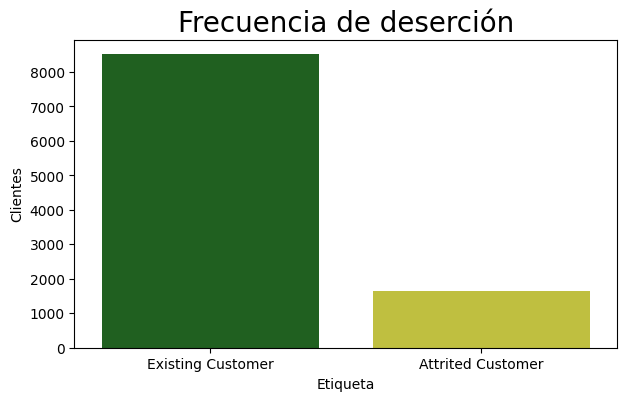

In [13]:
plt.figure(figsize=(7, 4))
sns.countplot(x='Attrition_Flag', data=datos,
              palette=['green', 'yellow'], saturation=0.5)
plt.title('Frecuencia de deserción', size=20)
plt.xlabel('Etiqueta')
plt.ylabel('Clientes')
plt.show()

#### Género

In [14]:
datos['Gender'].value_counts()

Gender
F    5345
M    4757
Name: count, dtype: int64

In [15]:
datos['Gender'].value_counts(normalize=True)

Gender
F    0.529103
M    0.470897
Name: proportion, dtype: float64

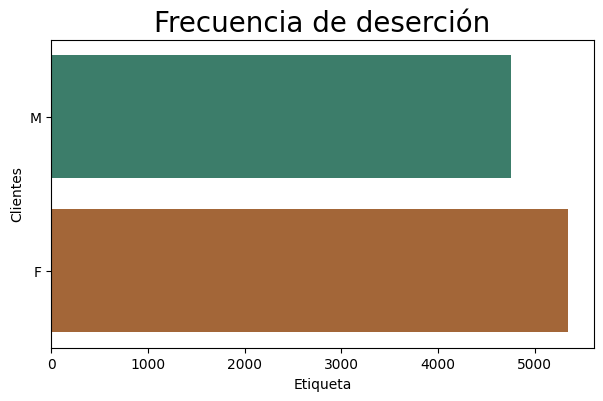

In [16]:
plt.figure(figsize=(7, 4))
sns.countplot(y='Gender', data=datos,
              palette='Dark2', saturation=0.5)
plt.title('Frecuencia de deserción', size=20)
plt.xlabel('Etiqueta')
plt.ylabel('Clientes')
plt.show()

#### Ejercicio:

Haga un breve análisis de frecuencias absolutas y relativas de la variable ***Education_Level***.

In [21]:
# Análisis de frecuencias absolutas
freq_abs = datos['Education_Level'].value_counts()

# Análisis de frecuencias relativas
freq_rel = datos['Education_Level'].value_counts(normalize=True)

# Mostrar resultados
print("Frecuencias absolutas:")
print(freq_abs)

print("\nFrecuencias relativas:")
print(freq_rel)

Frecuencias absolutas:
Education_Level
Graduate         3132
High School      2016
Uneducated       1491
College          1014
Post-Graduate     518
Doctorate         452
Name: count, dtype: int64

Frecuencias relativas:
Education_Level
Graduate         0.363215
High School      0.233793
Uneducated       0.172910
College          0.117592
Post-Graduate    0.060072
Doctorate        0.052418
Name: proportion, dtype: float64


### Análisis de distribución

#### Histogramas

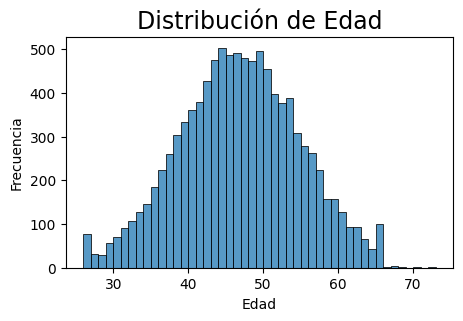

In [22]:
# Histograma
plt.figure(figsize=(5, 3))
sns.histplot(datos['Customer_Age'])
plt.title('Distribución de Edad', size=17)
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()

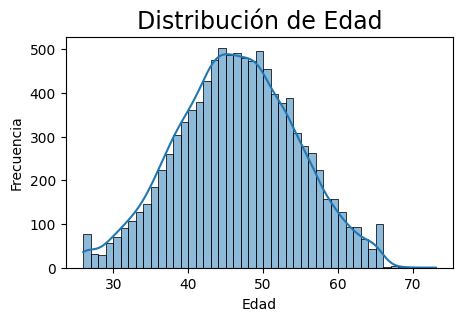

In [23]:
# Histograma con kde
plt.figure(figsize=(5, 3))
sns.histplot(datos['Customer_Age'], kde=True)
plt.title('Distribución de Edad', size=17)
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()

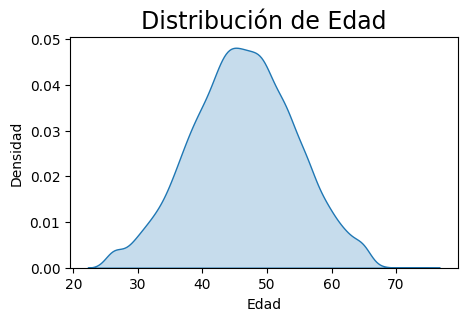

In [24]:
# Gráfico de densidad
plt.figure(figsize=(5, 3))
sns.kdeplot(datos['Customer_Age'], fill=True)
plt.title('Distribución de Edad', size=17)
plt.xlabel('Edad')
plt.ylabel('Densidad')
plt.show()

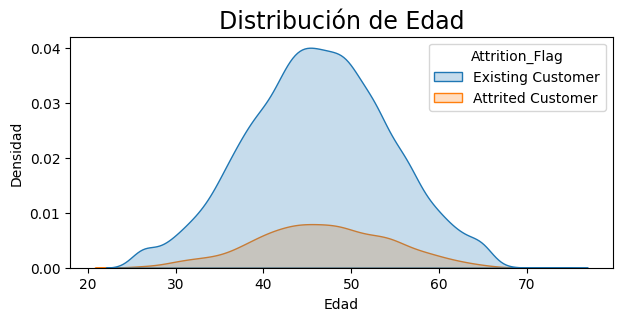

In [25]:
# Gráfico de densidad por categoría
plt.figure(figsize=(7, 3))
sns.kdeplot(x='Customer_Age', hue='Attrition_Flag', data=datos, fill=True)
plt.title('Distribución de Edad', size=17)
plt.xlabel('Edad')
plt.ylabel('Densidad')
plt.show()

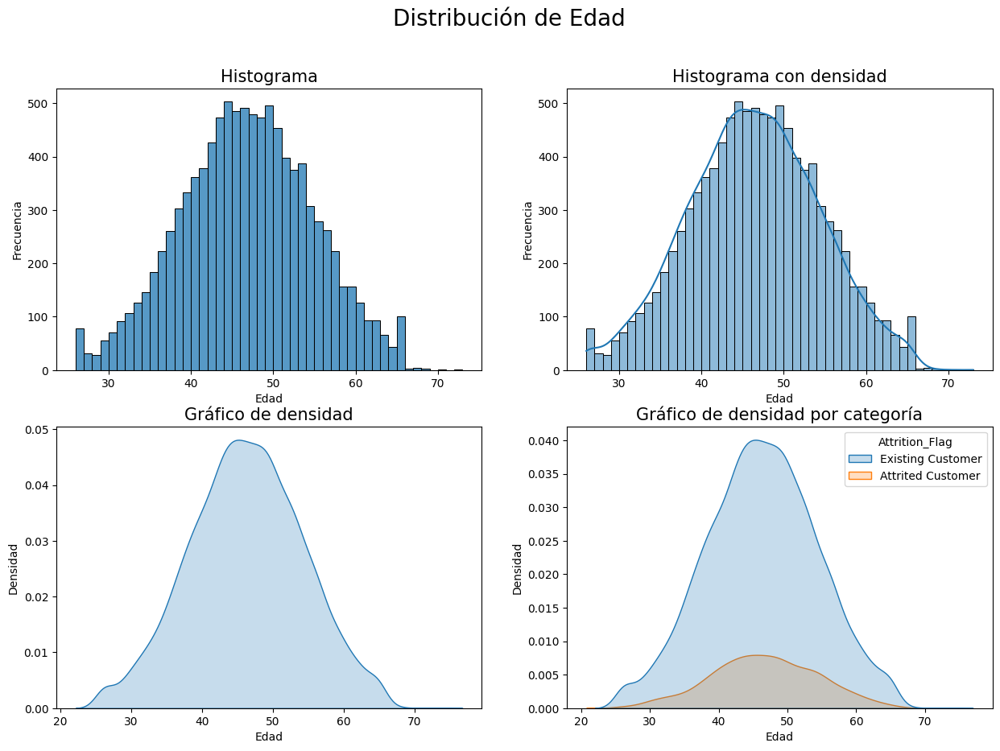

In [26]:
# Malla de gráficos

## Configuración general del gráfico
plt.figure(figsize=(15, 10))
plt.suptitle('Distribución de Edad', size=20)

## Primer gráfico
### La malla tendrá dos filas, dos columnas y éste será el primer gráfico
plt.subplot(2, 2, 1)
### Gráfico
sns.histplot(datos['Customer_Age'])
plt.title('Histograma', size=15)
plt.xlabel('Edad')
plt.ylabel('Frecuencia')

## Segundo gráfico
### La malla tendrá dos filas, dos columnas y éste será el segundo gráfico
plt.subplot(2, 2, 2)
### Gráfico
sns.histplot(datos['Customer_Age'], kde=True)
plt.title('Histograma con densidad', size=15)
plt.xlabel('Edad')
plt.ylabel('Frecuencia')

## Tercer gráfico
### La malla tendrá dos filas, dos columnas y éste será el tercer gráfico
plt.subplot(2, 2, 3)
### Gráfico
sns.kdeplot(datos['Customer_Age'], fill=True)
plt.title('Gráfico de densidad', size=15)
plt.xlabel('Edad')
plt.ylabel('Densidad')

## Cuarto gráfico
### La malla tendrá dos filas, dos columnas y éste será el cuarto gráfico
plt.subplot(2, 2, 4)
### Gráfico
sns.kdeplot(x='Customer_Age', hue='Attrition_Flag', data=datos, fill=True)
plt.title('Gráfico de densidad por categoría', size=15)
plt.xlabel('Edad')
plt.ylabel('Densidad')

## Visualizar el gráfico
plt.show()

#### Boxplots

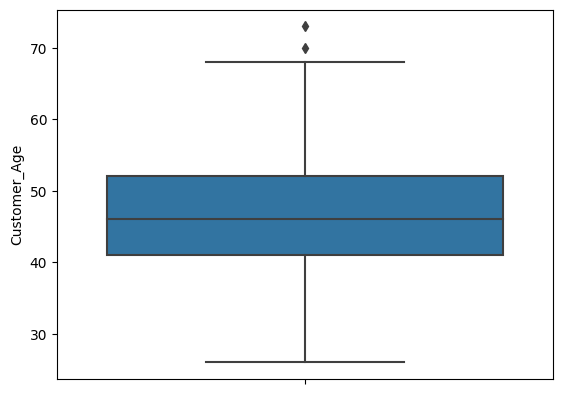

In [27]:
sns.boxplot(y='Customer_Age', data=datos)
plt.show()

#### Ejercicio:

Haga un breve análisis de distribucion para la variable ***Credit_Limit***. Presente 3 gráficas distintas en una sola imagen de 1 fila y 3 columnas.

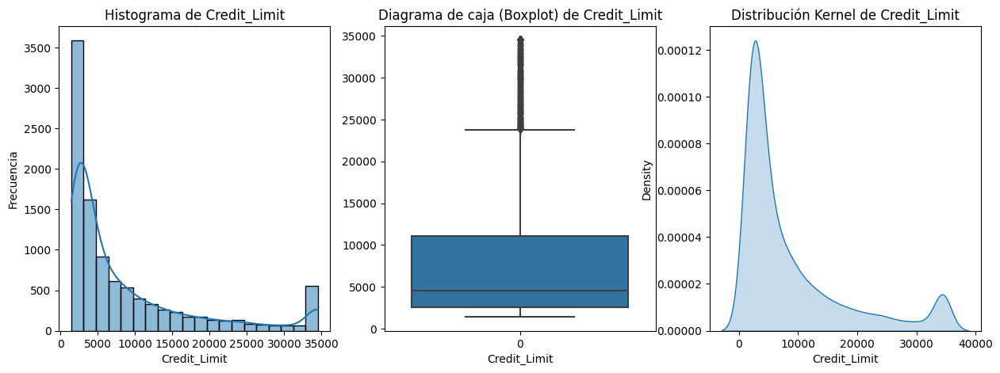

In [31]:
plt.figure(figsize=(15, 5))

# Histograma
plt.subplot(1, 3, 1)
sns.histplot(datos['Credit_Limit'], bins=20, kde=True)
plt.title("Histograma de Credit_Limit")
plt.xlabel("Credit_Limit")
plt.ylabel("Frecuencia")

# Boxplot
plt.subplot(1, 3, 2)
sns.boxplot(datos['Credit_Limit'])
plt.title("Diagrama de caja (Boxplot) de Credit_Limit")
plt.xlabel("Credit_Limit")

#  KDE Plot
plt.subplot(1, 3, 3)
sns.kdeplot(datos['Credit_Limit'], fill=True)
plt.title("Distribución Kernel de Credit_Limit")
plt.xlabel("Credit_Limit")

plt.show()

### Medidas de tendencia central

#### Media

In [32]:
descriptiva.loc['mean', :]

Customer_Age                   46.322752
Dependent_count                 2.346609
Income                      93325.617031
Months_on_book                 35.924487
Total_Relationship_Count        3.812401
Months_Inactive_12_mon          2.341483
Contacts_Count_12_mon           2.456033
Credit_Limit                 8631.875294
Total_Revolving_Bal          1162.909799
Avg_Open_To_Buy              7471.533034
Total_Amt_Chng_Q4_Q1            0.759986
Total_Trans_Amt              4404.199625
Total_Trans_Ct                 64.743414
Total_Ct_Chng_Q4_Q1             0.712076
Avg_Utilization_Ratio           0.274806
Name: mean, dtype: float64

In [33]:
datos.mean(numeric_only=True)

Customer_Age                   46.322752
Dependent_count                 2.346609
Income                      93325.617031
Months_on_book                 35.924487
Total_Relationship_Count        3.812401
Months_Inactive_12_mon          2.341483
Contacts_Count_12_mon           2.456033
Credit_Limit                 8631.875294
Total_Revolving_Bal          1162.909799
Avg_Open_To_Buy              7471.533034
Total_Amt_Chng_Q4_Q1            0.759986
Total_Trans_Amt              4404.199625
Total_Trans_Ct                 64.743414
Total_Ct_Chng_Q4_Q1             0.712076
Avg_Utilization_Ratio           0.274806
dtype: float64

#### Mediana

In [34]:
descriptiva.loc['50%', :]

Customer_Age                   46.000
Dependent_count                 2.000
Income                      50405.640
Months_on_book                 36.000
Total_Relationship_Count        4.000
Months_Inactive_12_mon          2.000
Contacts_Count_12_mon           2.000
Credit_Limit                 4549.000
Total_Revolving_Bal          1276.500
Avg_Open_To_Buy              3475.500
Total_Amt_Chng_Q4_Q1            0.736
Total_Trans_Amt              3898.000
Total_Trans_Ct                 67.000
Total_Ct_Chng_Q4_Q1             0.702
Avg_Utilization_Ratio           0.175
Name: 50%, dtype: float64

In [35]:
datos.median(numeric_only=True)

Customer_Age                   46.000
Dependent_count                 2.000
Income                      50405.640
Months_on_book                 36.000
Total_Relationship_Count        4.000
Months_Inactive_12_mon          2.000
Contacts_Count_12_mon           2.000
Credit_Limit                 4549.000
Total_Revolving_Bal          1276.500
Avg_Open_To_Buy              3475.500
Total_Amt_Chng_Q4_Q1            0.736
Total_Trans_Amt              3898.000
Total_Trans_Ct                 67.000
Total_Ct_Chng_Q4_Q1             0.702
Avg_Utilization_Ratio           0.175
dtype: float64

#### Moda

In [36]:
datos.mode()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,44.0,F,3.0,Graduate,Married,5365.76,Blue,36.0,3.0,3.0,3.0,34516.0,0.0,1438.3,0.791,2229.0,81.0,0.667,0.0
1,NaN,NaN,NaN,NaN,NaN,NaN,6190.37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4253.0,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,24861.49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4509.0,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,27559.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,45028.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,45227.76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,51427.94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,53796.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,54055.60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,64973.94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
datos['Marital_Status'].value_counts().index[0]

'Married'

In [41]:
datos['Marital_Status'].value_counts().to_frame().iloc[0]

count    4695
Name: Married, dtype: int64

In [42]:
datos['Marital_Status'].mode()

0    Married
Name: Marital_Status, dtype: object

### Medidas de Forma

#### Kurtosis

In [43]:
datos.kurtosis(numeric_only=True)

Customer_Age                -0.287563
Dependent_count             -0.682053
Income                      13.606857
Months_on_book               0.403265
Total_Relationship_Count    -1.006136
Months_Inactive_12_mon       1.104530
Contacts_Count_12_mon       -0.000573
Credit_Limit                 1.809549
Total_Revolving_Bal         -1.146389
Avg_Open_To_Buy              1.798669
Total_Amt_Chng_Q4_Q1         9.977923
Total_Trans_Amt              3.887015
Total_Trans_Ct              -0.370293
Total_Ct_Chng_Q4_Q1         15.672651
Avg_Utilization_Ratio       -0.793680
dtype: float64

#### Asimetría

In [44]:
datos.skew(numeric_only=True)

Customer_Age               -0.032889
Dependent_count            -0.021386
Income                      3.710707
Months_on_book             -0.108326
Total_Relationship_Count   -0.162272
Months_Inactive_12_mon      0.634747
Contacts_Count_12_mon       0.009163
Credit_Limit                1.666839
Total_Revolving_Bal        -0.148822
Avg_Open_To_Buy             1.661719
Total_Amt_Chng_Q4_Q1        1.731220
Total_Trans_Amt             2.039915
Total_Trans_Ct              0.159321
Total_Ct_Chng_Q4_Q1         2.061578
Avg_Utilization_Ratio       0.718825
dtype: float64

### Medidas de Posición

#### Cuartiles

In [45]:
descriptiva

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10144.000000,10144.000000,9029.000000,10144.000000,10144.000000,10144.000000,10144.000000,10127.000000,10144.000000,10144.000000,10144.000000,10144.000000,9946.000000,10144.000000,10144.000000
mean,46.322752,2.346609,93325.617031,35.924487,3.812401,2.341483,2.456033,8631.875294,1162.909799,7471.533034,0.759986,4404.199625,64.743414,0.712076,0.274806
std,8.015804,1.298697,165421.878809,7.987754,1.554238,1.010889,1.106317,9088.521307,815.156610,9091.746865,0.219205,3398.469966,23.478140,0.238064,0.275682
min,26.000000,0.000000,0.860000,12.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,26062.140000,31.000000,3.000000,2.000000,2.000000,2555.000000,357.000000,1325.750000,0.631000,2154.750000,45.000000,0.581000,0.023000
50%,46.000000,2.000000,50405.640000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.500000,3475.500000,0.736000,3898.000000,67.000000,0.702000,0.175000
75%,52.000000,3.000000,80150.360000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9861.750000,0.859000,4741.000000,81.000000,0.818000,0.502250
max,73.000000,5.000000,998717.740000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [46]:
descriptiva.loc['25%':, :]

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
25%,41.0,1.0,26062.14,31.0,3.0,2.0,2.0,2555.0,357.0,1325.75,0.631,2154.75,45.0,0.581,0.02300
50%,46.0,2.0,50405.64,36.0,4.0,2.0,2.0,4549.0,1276.5,3475.50,0.736,3898.00,67.0,0.702,0.17500
75%,52.0,3.0,80150.36,40.0,5.0,3.0,3.0,11067.5,1784.0,9861.75,0.859,4741.00,81.0,0.818,0.50225
max,73.0,5.0,998717.74,56.0,6.0,6.0,6.0,34516.0,2517.0,34516.00,3.397,18484.00,139.0,3.714,0.99900


#### Percentiles

In [47]:
datos.quantile(0.1, numeric_only=True)

Customer_Age                   36.000
Dependent_count                 1.000
Income                      10459.336
Months_on_book                 26.000
Total_Relationship_Count        2.000
Months_Inactive_12_mon          1.000
Contacts_Count_12_mon           1.000
Credit_Limit                 1761.600
Total_Revolving_Bal             0.000
Avg_Open_To_Buy               683.000
Total_Amt_Chng_Q4_Q1            0.531
Total_Trans_Amt              1501.000
Total_Trans_Ct                 33.000
Total_Ct_Chng_Q4_Q1             0.452
Avg_Utilization_Ratio           0.000
Name: 0.1, dtype: float64

In [48]:
datos.quantile(0.2, numeric_only=True)

Customer_Age                   39.000
Dependent_count                 1.000
Income                      20692.000
Months_on_book                 30.000
Total_Relationship_Count        2.000
Months_Inactive_12_mon          1.000
Contacts_Count_12_mon           2.000
Credit_Limit                 2306.200
Total_Revolving_Bal             0.000
Avg_Open_To_Buy              1026.600
Total_Amt_Chng_Q4_Q1            0.604
Total_Trans_Amt              1913.600
Total_Trans_Ct                 41.000
Total_Ct_Chng_Q4_Q1             0.545
Avg_Utilization_Ratio           0.000
Name: 0.2, dtype: float64

In [49]:
datos.quantile(0.25, numeric_only=True)

Customer_Age                   41.000
Dependent_count                 1.000
Income                      26062.140
Months_on_book                 31.000
Total_Relationship_Count        3.000
Months_Inactive_12_mon          2.000
Contacts_Count_12_mon           2.000
Credit_Limit                 2555.000
Total_Revolving_Bal           357.000
Avg_Open_To_Buy              1325.750
Total_Amt_Chng_Q4_Q1            0.631
Total_Trans_Amt              2154.750
Total_Trans_Ct                 45.000
Total_Ct_Chng_Q4_Q1             0.581
Avg_Utilization_Ratio           0.023
Name: 0.25, dtype: float64

#### Deciles

In [50]:
datos.quantile(np.arange(0, 1.1, 0.1), numeric_only=True)

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0.0,26.0,0.0,0.860,12.0,1.0,0.0,0.0,1438.3,0.0,3.0,0.000,510.0,10.0,0.000,0.0000
0.1,36.0,1.0,10459.336,26.0,2.0,1.0,1.0,1761.6,0.0,683.0,0.531,1501.0,33.0,0.452,0.0000
0.2,39.0,1.0,20692.000,30.0,2.0,1.0,2.0,2306.2,0.0,1026.6,0.604,1913.6,41.0,0.545,0.0000
0.3,42.0,2.0,30436.724,33.0,3.0,2.0,2.0,2787.0,748.0,1467.0,0.655,2410.8,49.0,0.609,0.0510
0.4,44.0,2.0,40600.612,36.0,3.0,2.0,2.0,3399.0,1037.2,2225.4,0.697,3188.0,60.0,0.657,0.1000
0.5,46.0,2.0,50405.640,36.0,4.0,2.0,2.0,4549.0,1276.5,3475.5,0.736,3898.0,67.0,0.702,0.1750
0.6,48.0,3.0,60888.142,36.0,4.0,3.0,3.0,6287.2,1482.0,5195.8,0.781,4266.8,72.0,0.745,0.2770
0.7,51.0,3.0,73782.700,39.0,5.0,3.0,3.0,9078.0,1674.0,7888.1,0.830,4572.0,78.0,0.791,0.4291
0.8,53.0,3.0,91894.880,42.0,5.0,3.0,3.0,13552.6,1903.0,12419.4,0.892,4926.0,83.0,0.853,0.5730
0.9,57.0,4.0,115199.712,46.0,6.0,3.0,4.0,23400.2,2229.0,21967.3,0.998,8214.4,92.0,0.950,0.7070


#### Quintiles

In [51]:
datos.quantile(np.arange(0, 1.1, 0.2), numeric_only=True)

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0.0,26.0,0.0,0.860,12.0,1.0,0.0,0.0,1438.3,0.0,3.0,0.000,510.0,10.0,0.000,0.000
0.2,39.0,1.0,20692.000,30.0,2.0,1.0,2.0,2306.2,0.0,1026.6,0.604,1913.6,41.0,0.545,0.000
0.4,44.0,2.0,40600.612,36.0,3.0,2.0,2.0,3399.0,1037.2,2225.4,0.697,3188.0,60.0,0.657,0.100
0.6,48.0,3.0,60888.142,36.0,4.0,3.0,3.0,6287.2,1482.0,5195.8,0.781,4266.8,72.0,0.745,0.277
0.8,53.0,3.0,91894.880,42.0,5.0,3.0,3.0,13552.6,1903.0,12419.4,0.892,4926.0,83.0,0.853,0.573
1.0,73.0,5.0,998717.740,56.0,6.0,6.0,6.0,34516.0,2517.0,34516.0,3.397,18484.0,139.0,3.714,0.999


#### Cuartiles

In [52]:
datos.quantile(np.arange(0, 1.1, 0.25), numeric_only=True)

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0.00,26.0,0.0,0.86,12.0,1.0,0.0,0.0,1438.3,0.0,3.00,0.000,510.00,10.0,0.000,0.00000
0.25,41.0,1.0,26062.14,31.0,3.0,2.0,2.0,2555.0,357.0,1325.75,0.631,2154.75,45.0,0.581,0.02300
0.50,46.0,2.0,50405.64,36.0,4.0,2.0,2.0,4549.0,1276.5,3475.50,0.736,3898.00,67.0,0.702,0.17500
0.75,52.0,3.0,80150.36,40.0,5.0,3.0,3.0,11067.5,1784.0,9861.75,0.859,4741.00,81.0,0.818,0.50225
1.00,73.0,5.0,998717.74,56.0,6.0,6.0,6.0,34516.0,2517.0,34516.00,3.397,18484.00,139.0,3.714,0.99900


### Medidas de Dispersión

#### Rango

In [53]:
descriptiva.loc[['min', 'max'], :]

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
min,26.0,0.0,0.86,12.0,1.0,0.0,0.0,1438.3,0.0,3.0,0.000,510.0,10.0,0.000,0.000
max,73.0,5.0,998717.74,56.0,6.0,6.0,6.0,34516.0,2517.0,34516.0,3.397,18484.0,139.0,3.714,0.999


#### Varianza

In [54]:
descriptiva

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10144.000000,10144.000000,9029.000000,10144.000000,10144.000000,10144.000000,10144.000000,10127.000000,10144.000000,10144.000000,10144.000000,10144.000000,9946.000000,10144.000000,10144.000000
mean,46.322752,2.346609,93325.617031,35.924487,3.812401,2.341483,2.456033,8631.875294,1162.909799,7471.533034,0.759986,4404.199625,64.743414,0.712076,0.274806
std,8.015804,1.298697,165421.878809,7.987754,1.554238,1.010889,1.106317,9088.521307,815.156610,9091.746865,0.219205,3398.469966,23.478140,0.238064,0.275682
min,26.000000,0.000000,0.860000,12.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,26062.140000,31.000000,3.000000,2.000000,2.000000,2555.000000,357.000000,1325.750000,0.631000,2154.750000,45.000000,0.581000,0.023000
50%,46.000000,2.000000,50405.640000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.500000,3475.500000,0.736000,3898.000000,67.000000,0.702000,0.175000
75%,52.000000,3.000000,80150.360000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9861.750000,0.859000,4741.000000,81.000000,0.818000,0.502250
max,73.000000,5.000000,998717.740000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [55]:
datos.var(numeric_only=True)

Customer_Age                6.425311e+01
Dependent_count             1.686614e+00
Income                      2.736440e+10
Months_on_book              6.380422e+01
Total_Relationship_Count    2.415656e+00
Months_Inactive_12_mon      1.021897e+00
Contacts_Count_12_mon       1.223937e+00
Credit_Limit                8.260122e+07
Total_Revolving_Bal         6.644803e+05
Avg_Open_To_Buy             8.265986e+07
Total_Amt_Chng_Q4_Q1        4.805074e-02
Total_Trans_Amt             1.154960e+07
Total_Trans_Ct              5.512230e+02
Total_Ct_Chng_Q4_Q1         5.667437e-02
Avg_Utilization_Ratio       7.600081e-02
dtype: float64

#### Desviación Estándar

In [56]:
descriptiva.loc['std', :]

Customer_Age                     8.015804
Dependent_count                  1.298697
Income                      165421.878809
Months_on_book                   7.987754
Total_Relationship_Count         1.554238
Months_Inactive_12_mon           1.010889
Contacts_Count_12_mon            1.106317
Credit_Limit                  9088.521307
Total_Revolving_Bal            815.156610
Avg_Open_To_Buy               9091.746865
Total_Amt_Chng_Q4_Q1             0.219205
Total_Trans_Amt               3398.469966
Total_Trans_Ct                  23.478140
Total_Ct_Chng_Q4_Q1              0.238064
Avg_Utilization_Ratio            0.275682
Name: std, dtype: float64

In [57]:
datos.std(numeric_only=True)

Customer_Age                     8.015804
Dependent_count                  1.298697
Income                      165421.878809
Months_on_book                   7.987754
Total_Relationship_Count         1.554238
Months_Inactive_12_mon           1.010889
Contacts_Count_12_mon            1.106317
Credit_Limit                  9088.521307
Total_Revolving_Bal            815.156610
Avg_Open_To_Buy               9091.746865
Total_Amt_Chng_Q4_Q1             0.219205
Total_Trans_Amt               3398.469966
Total_Trans_Ct                  23.478140
Total_Ct_Chng_Q4_Q1              0.238064
Avg_Utilization_Ratio            0.275682
dtype: float64

#### Coeficiente de Varianza

In [58]:
datos.std(numeric_only=True)/datos.mean(numeric_only=True)

Customer_Age                0.173042
Dependent_count             0.553436
Income                      1.772524
Months_on_book              0.222348
Total_Relationship_Count    0.407680
Months_Inactive_12_mon      0.431730
Contacts_Count_12_mon       0.450449
Credit_Limit                1.052902
Total_Revolving_Bal         0.700963
Avg_Open_To_Buy             1.216852
Total_Amt_Chng_Q4_Q1        0.288433
Total_Trans_Amt             0.771643
Total_Trans_Ct              0.362634
Total_Ct_Chng_Q4_Q1         0.334323
Avg_Utilization_Ratio       1.003189
dtype: float64

### Ejercicio:

Haga un breve análisis descriptivo de la variable ***Total_Amt_Chng_Q4_Q1***. Mencione aspectos importantes sobre sus valores centrales, su dispersión, distribución y forma.

<center>
    <font size="4" color="red"><i>Su respuesta aquí</i></font><br>
</center>

*Respuesta*

Estadísticas descriptivas de Total_Amt_Chng_Q4_Q1:
count    10144.000000
mean         0.759986
std          0.219205
min          0.000000
25%          0.631000
50%          0.736000
75%          0.859000
max          3.397000
Name: Total_Amt_Chng_Q4_Q1, dtype: float64

Mediana de Total_Amt_Chng_Q4_Q1: 0.736


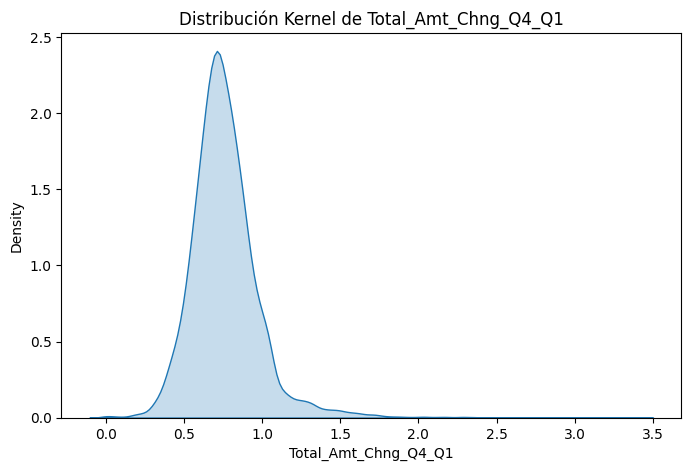

In [61]:
# Estadísticas descriptivas
desc_stats = datos['Total_Amt_Chng_Q4_Q1'].describe()

# Mediana
median = datos['Total_Amt_Chng_Q4_Q1'].median()

# Gráfico de densidad (KDE Plot)
plt.figure(figsize=(8, 5))
sns.kdeplot(datos['Total_Amt_Chng_Q4_Q1'], fill=True)
plt.title("Distribución Kernel de Total_Amt_Chng_Q4_Q1")
plt.xlabel("Total_Amt_Chng_Q4_Q1")

# Mostrar estadísticas descriptivas
print("Estadísticas descriptivas de Total_Amt_Chng_Q4_Q1:")
print(desc_stats)

print("\nMediana de Total_Amt_Chng_Q4_Q1:", median)

# Mostrar gráfico
plt.show()

Total de observaciones válidas: 10,144.

Media: 0.76, indicando que en promedio, los clientes experimentan un cambio en el monto total de transacciones entre el cuarto trimestre y el primer trimestre.

Desviación estándar: 0.22, sugiriendo que los valores tienden a variar alrededor de la media y dando una idea de la dispersión de los datos.

Valor mínimo: 0, indicando que algunos clientes no tuvieron cambios en el monto de transacciones entre ambos trimestres.

Primer cuartil (25%): 0.63, lo que significa que el 25% de los clientes tienen un cambio en el monto total de transacciones menor o igual a este valor.

Mediana (segundo cuartil, 50%): 0.736, siendo la medida central de la distribución, y el 50% de los clientes tienen un cambio en el monto de transacciones igual o inferior a este valor.

Tercer cuartil (75%): 0.859, indicando que el 75% de los clientes tienen un cambio en el monto total de transacciones menor o igual a este valor.

Valor máximo: 3.397, mostrando la presencia de algunos valores atípicos muy alejados del resto de las observaciones.


# Medidas Multivariadas

## Análisis de frecuencias cruzadas

In [62]:
# Tabla de contingencia con valores absolutos
pd.crosstab(datos['Attrition_Flag'],
            datos['Gender'])

Gender,F,M
Attrition_Flag,,
Attrited Customer,929,696
Existing Customer,4416,4061


In [63]:
# Tabla de contingencia con valores absolutos y totales
pd.crosstab(datos['Attrition_Flag'],
            datos['Gender'],
            margins=True)

Gender,F,M,All
Attrition_Flag,,,
Attrited Customer,929,696,1625
Existing Customer,4416,4061,8477
All,5345,4757,10102


In [64]:
# Tabla de contingencia con valores relativos por filas
pd.crosstab(datos['Attrition_Flag'],
            datos['Gender'],
            normalize='index',
            margins=True)

Gender,F,M
Attrition_Flag,,
Attrited Customer,0.571692,0.428308
Existing Customer,0.520939,0.479061
All,0.529103,0.470897


In [65]:
# Tabla de contingencia con valores relativos por columnas
pd.crosstab(datos['Attrition_Flag'],
            datos['Gender'],
            normalize='columns',
            margins=True)

Gender,F,M,All
Attrition_Flag,,,
Attrited Customer,0.173807,0.146311,0.160859
Existing Customer,0.826193,0.853689,0.839141


In [66]:
# Tabla de contingencia con valores relativos totales
pd.crosstab(datos['Attrition_Flag'],
            datos['Gender'],
            normalize='all',
            margins=True)

Gender,F,M,All
Attrition_Flag,,,
Attrited Customer,0.091962,0.068897,0.160859
Existing Customer,0.437141,0.402000,0.839141
All,0.529103,0.470897,1.000000


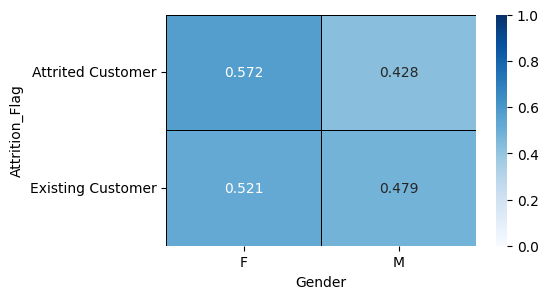

In [67]:
# Heatmap de frecuencias cruzadas
cross_ag = pd.crosstab(datos['Attrition_Flag'],
                       datos['Gender'],
                       normalize='index')

plt.figure(figsize=(5, 3))
sns.heatmap(cross_ag, annot=True,
            cmap='Blues',
            linewidths=0.5,
            linecolor='black',
            fmt = ".3f",
            vmin=0, vmax=1)
plt.show()

#### Ejercicio:

Realice un breve análisis de frecuencias cruzadas para las variables ***Attrition_Flag*** (filas) y ***Card_Category*** (columnas). Haga un heatmap mostrando las frecuencias relativas por columnas.

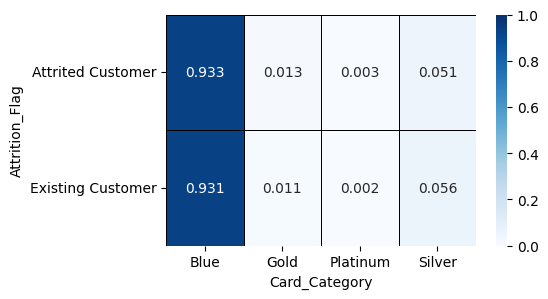

In [68]:
# Heatmap de frecuencias cruzadas
cross_ag = pd.crosstab(datos['Attrition_Flag'],
                       datos['Card_Category'],
                       normalize='index')

plt.figure(figsize=(5, 3))
sns.heatmap(cross_ag, annot=True,
            cmap='Blues',
            linewidths=0.5,
            linecolor='black',
            fmt = ".3f",
            vmin=0, vmax=1)
plt.show()

## Análisis de dispersión

### Gráfico de dispersión

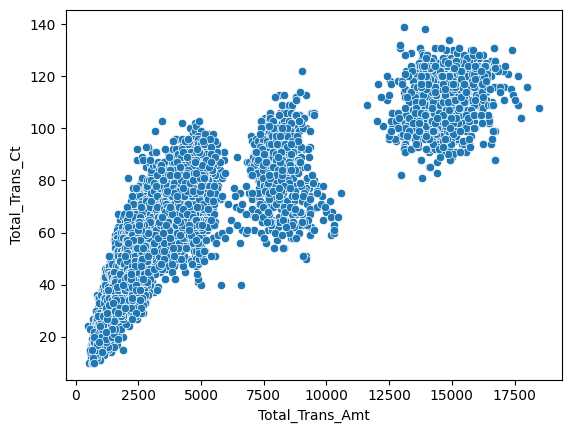

In [69]:
# Dispersión entre dos variables
sns.scatterplot(x='Total_Trans_Amt', y='Total_Trans_Ct', data=datos,)
plt.show()

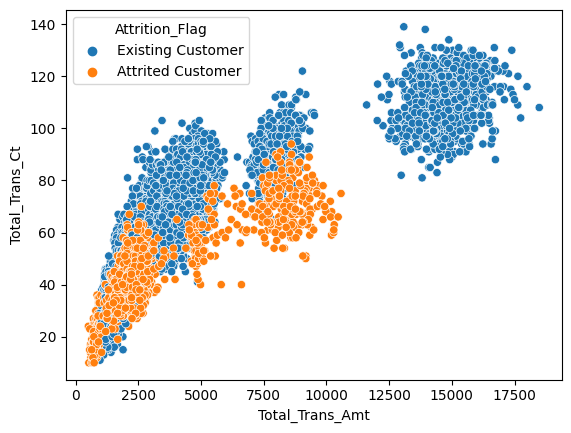

In [70]:
# Dispersión entre dos variables por categoría
sns.scatterplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
                hue='Attrition_Flag', data=datos)
plt.show()

### Jointplots

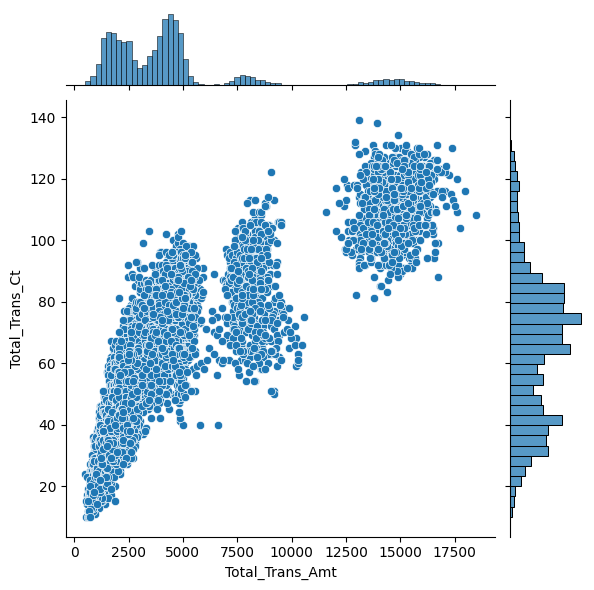

In [71]:
# Gráfico de dispersión y distribución por variable
sns.jointplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
              data=datos, kind='scatter')
plt.show()

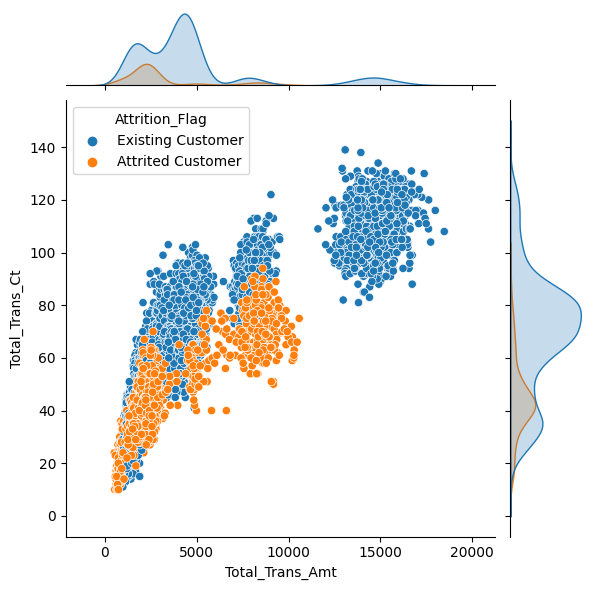

In [72]:
# Gráfico de dispersión y distribución por variable y categoría
sns.jointplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
              data=datos, hue='Attrition_Flag')
plt.show()

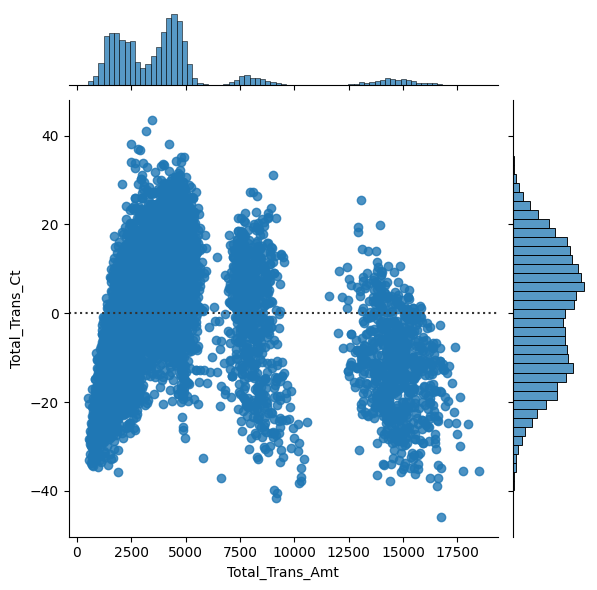

In [73]:
# Gráfico de dispersión de los residuales
sns.jointplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
              data=datos, kind='resid')
plt.show()

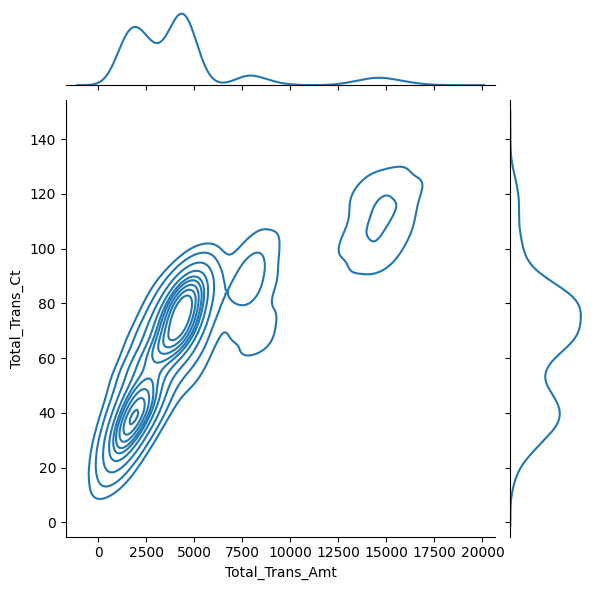

In [74]:
# Gráfico de densidad en dos dimensiones
sns.jointplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
              data=datos, kind='kde')
plt.show()

### Gráfico de dispersión con línea de ajuste

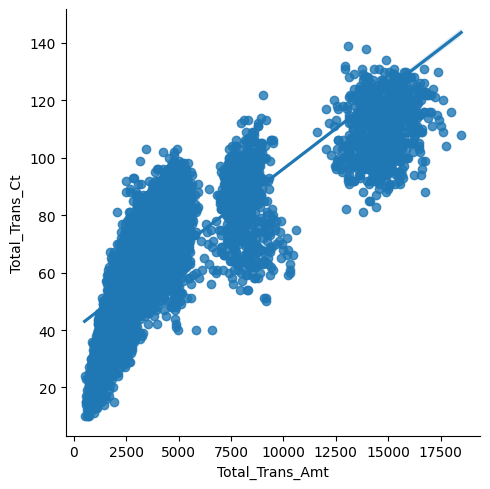

In [75]:
# Dispersión con ajuste
sns.lmplot(x='Total_Trans_Amt', y='Total_Trans_Ct', data=datos)
plt.show()

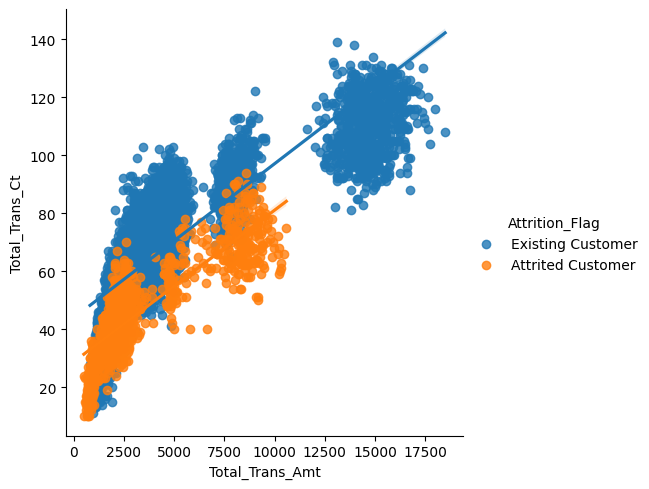

In [76]:
# Dispersión con ajuste por categoría
sns.lmplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
           hue='Attrition_Flag', data=datos)
plt.show()

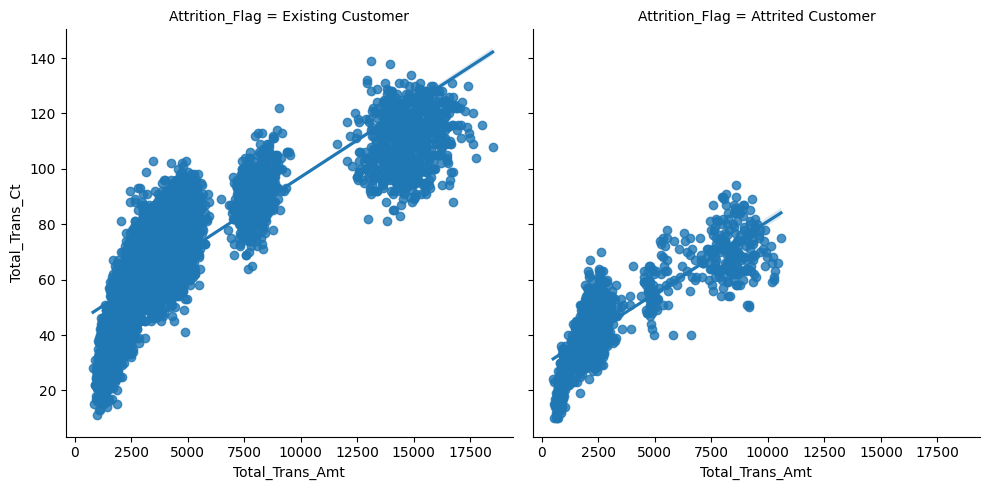

In [77]:
# Dispersión con ajuste por categoría usando facets
sns.lmplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
           col='Attrition_Flag', data=datos)
plt.show()

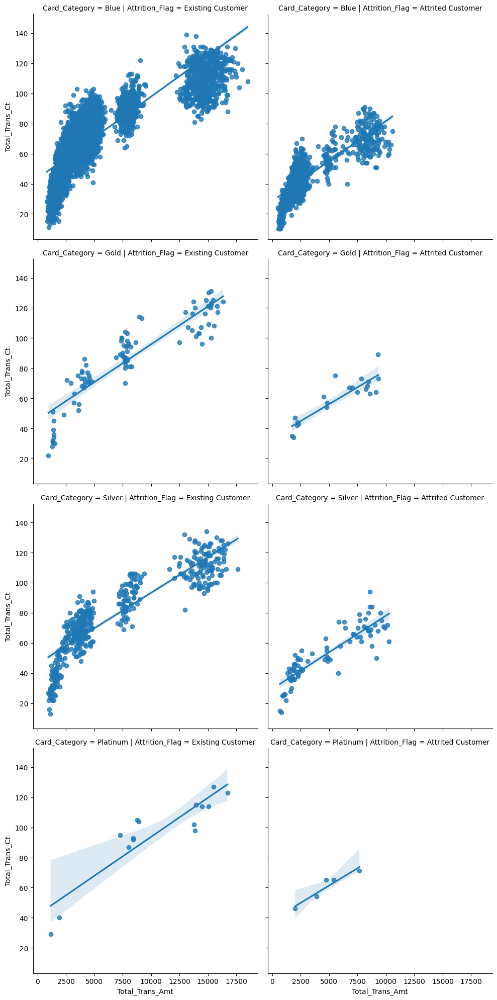

In [78]:
# Dispersión con ajuste y doble división categórica
sns.lmplot(x='Total_Trans_Amt', y='Total_Trans_Ct',
           col='Attrition_Flag', row='Card_Category', data=datos)
plt.show()

### Ejercicio:

Haga un breve análisis de dispersión entre las variables ***Total_Amt_Chng_Q4_Q1*** y ***Total_Ct_Chng_Q4_Q1***. ¿Evidencia algún tipo de relación? Haga uso de los gráficos necesarios vistos en esta sección para responder la pregunta. ¿Tiene sentido el resultado?

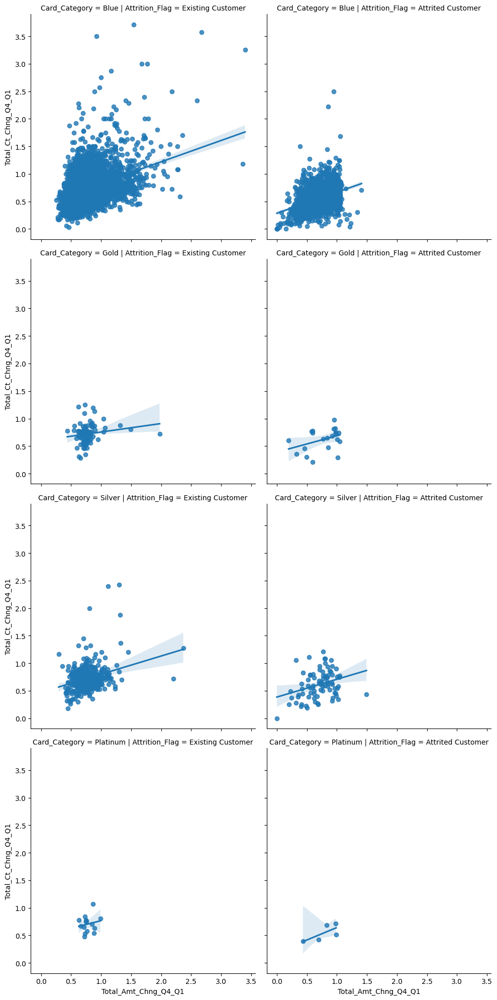

In [79]:
# Dispersión con ajuste y doble división categórica
sns.lmplot(x='Total_Amt_Chng_Q4_Q1', y='Total_Ct_Chng_Q4_Q1',
           col='Attrition_Flag', row='Card_Category', data=datos)
plt.show()

<center>
    <font size="4" color="red"><i>Su respuesta aquí</i></font><br>
</center>

*Respuesta*

### Pairplots

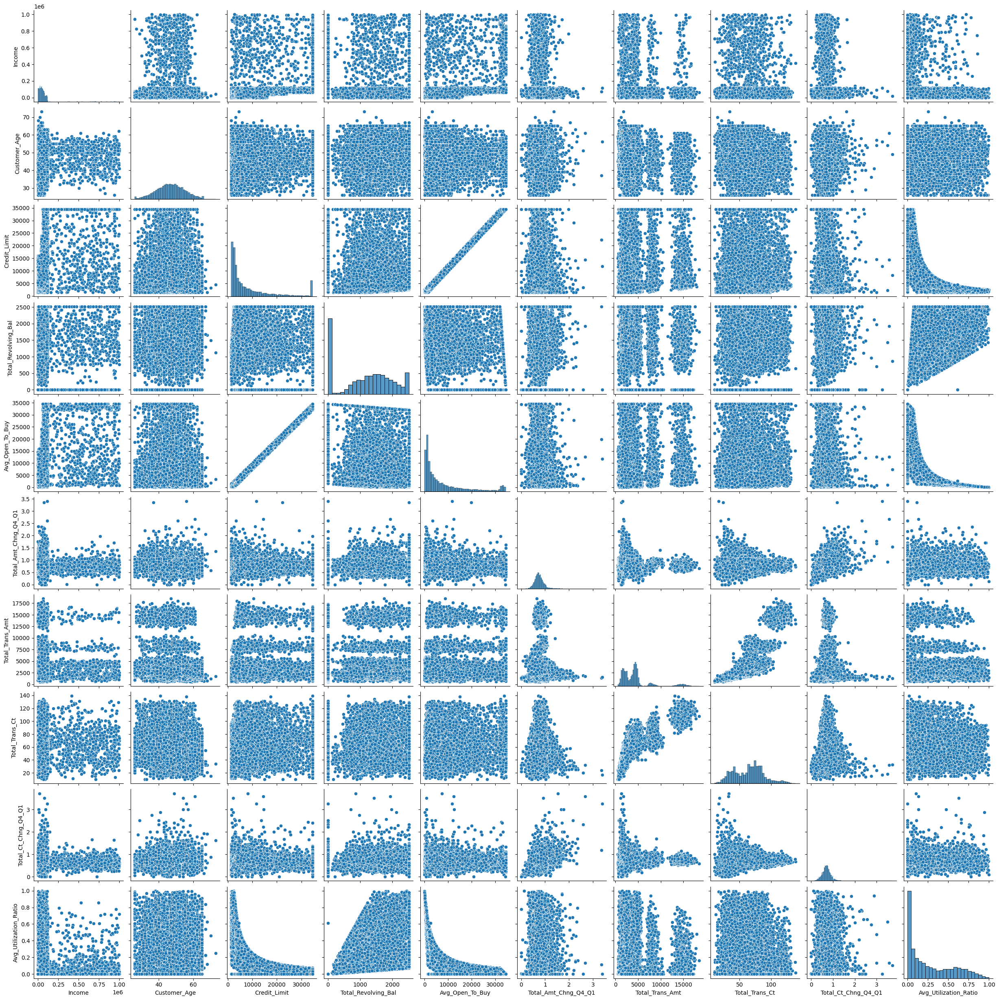

In [80]:
# Definiendo variables numéricas
num_continuas = [
    'Attrition_Flag', 'Income', 'Customer_Age', 'Credit_Limit', 'Total_Revolving_Bal',
    'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
    'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
datos_num = datos[num_continuas]

# Pairplot de variables numéricas
sns.pairplot(datos_num)
plt.show()

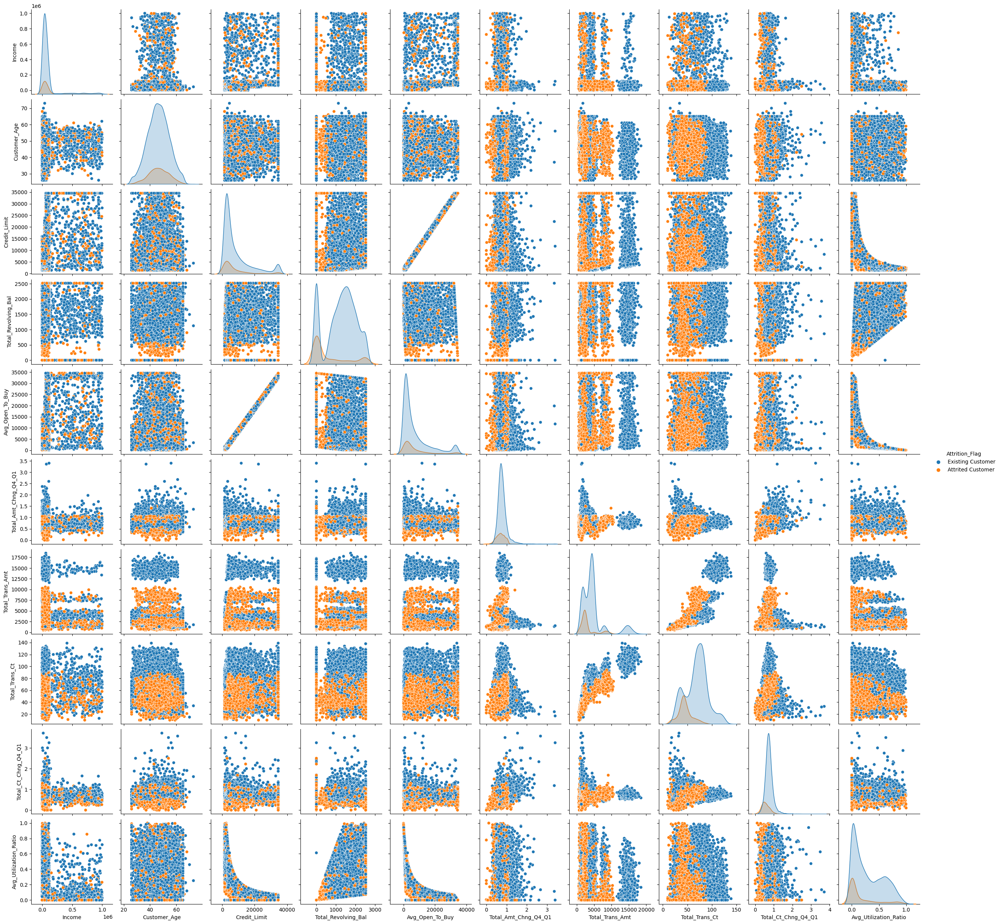

In [81]:
# Pairplot de variables numéricas por categorías
sns.pairplot(datos_num, hue='Attrition_Flag')
plt.show()

## Análisis de distribución

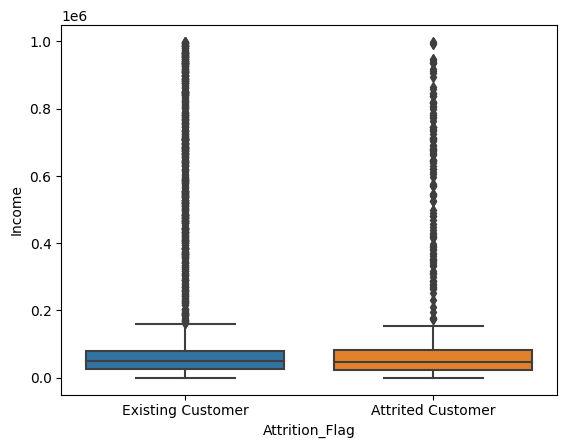

In [82]:
# Distribución del ingreso por deserción
sns.boxplot(x='Attrition_Flag', y='Income', data=datos)
plt.show()

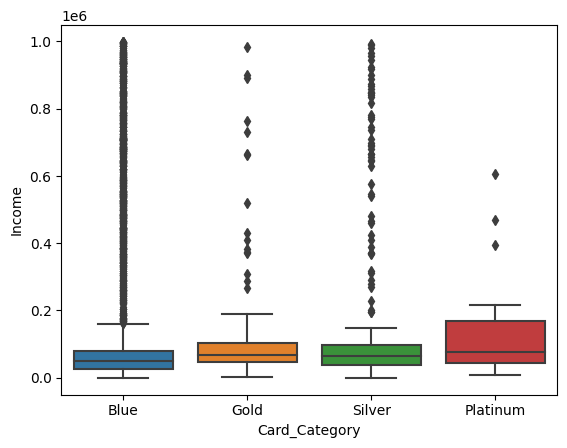

In [83]:
# Distribución del ingreso por categoría de tarjeta
sns.boxplot(x='Card_Category', y='Income', data=datos)
plt.show()

### Ejercicio:

Haga un breve análisis de distribución entre ***Credit_Limit*** y ***Card_Category***. ¿Nota algún comportamiento particular en estas distribuciones por categoría? ¿Tiene sentido?

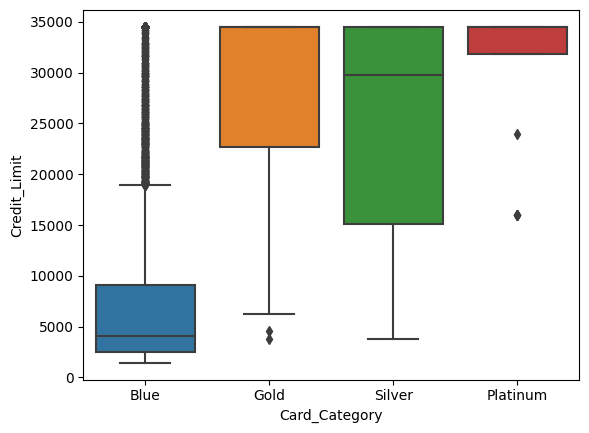

In [86]:
# Distribución del ingreso por categoría de tarjeta
sns.boxplot(x='Card_Category', y='Credit_Limit', data=datos)
plt.show()

<center>
    <font size="4" color="red"><i>Su respuesta aquí</i></font><br>
</center>

*Respuesta*

## Análisis de correlación

In [87]:
datos.cov(numeric_only=True)

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Customer_Age,64.253111,-1.273863,4.317492e+04,50.494058,-0.139781,0.441091,-0.172932,1.984686e+02,9.888991e+01,8.565611e+01,-0.107797,-1.247569e+03,-12.522177,-0.022148,0.017095
Dependent_count,-1.273863,1.686614,7.738149e+03,-1.077048,-0.079996,-0.013768,-0.057716,8.079803e+02,-2.984507e+00,8.122662e+02,-0.010234,1.103526e+02,1.487188,0.003302,-0.013569
Income,43174.924593,7738.149306,2.736440e+10,31200.396865,1111.866055,-838.984326,3649.098751,5.936493e+08,2.460588e+06,5.921592e+08,20.171335,2.622884e+06,-105322.270336,-1026.237524,-9142.738331
Months_on_book,50.494058,-1.077048,3.120040e+04,63.804215,-0.108617,0.596133,-0.098953,5.409121e+02,5.622744e+01,4.750461e+02,-0.084202,-1.033013e+03,-9.220212,-0.025368,-0.014813
Total_Relationship_Count,-0.139781,-0.079996,1.111866e+03,-0.108617,2.415656,-0.006128,0.095517,-1.029500e+03,1.764048e+01,-1.033663e+03,0.017199,-1.835858e+03,-8.847942,0.015252,0.029054
Months_Inactive_12_mon,0.441091,-0.013768,-8.389843e+02,0.596133,-0.006128,1.021897,0.032762,-1.866786e+02,-3.403141e+01,-1.476273e+02,-0.007241,-1.260930e+02,-1.013791,-0.009317,-0.002181
Contacts_Count_12_mon,-0.172932,-0.057716,3.649099e+03,-0.098953,0.095517,0.032762,1.223937,1.979204e+02,-4.897897e+01,2.521514e+02,-0.006067,-4.248298e+02,-3.951247,-0.025079,-0.016913
Credit_Limit,198.468647,807.980325,5.936493e+08,540.912068,-1029.500160,-186.678602,197.920403,8.260122e+07,3.183285e+05,8.228365e+07,25.023024,5.327615e+06,16501.615957,-3.444836,-1209.853694
Total_Revolving_Bal,98.889906,-2.984507,2.460588e+06,56.227438,17.640476,-34.031405,-48.978974,3.183285e+05,6.644803e+05,-3.454201e+05,10.338312,1.784033e+05,1040.688476,17.567685,140.113505
Avg_Open_To_Buy,85.656112,812.266208,5.921592e+08,475.046121,-1033.662963,-147.627273,252.151364,8.228365e+07,-3.454201e+05,8.265986e+07,14.394536,5.142407e+06,15387.066191,-22.132330,-1350.061952


In [88]:
datos.corr(numeric_only=True) # Correlación de Pearson

,Customer_Age,Dependent_count,Income,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Customer_Age,1.000000,-0.122368,0.032896,0.788621,-0.011220,0.054435,-0.019501,0.002725,0.015134,0.001175,-0.061349,-0.045797,-0.066464,-0.011606,0.007736
Dependent_count,-0.122368,1.000000,0.036120,-0.103825,-0.039632,-0.010488,-0.040171,0.068434,-0.002819,0.068793,-0.035950,0.025003,0.048726,0.010682,-0.037899
Income,0.032896,0.036120,1.000000,0.023795,0.004320,-0.005045,0.019910,0.392820,0.018290,0.391751,0.000555,0.004592,-0.026883,-0.026144,-0.198460
Months_on_book,0.788621,-0.103825,0.023795,1.000000,-0.008749,0.073827,-0.011198,0.007455,0.008635,0.006541,-0.048089,-0.038054,-0.049079,-0.013340,-0.006727
Total_Relationship_Count,-0.011220,-0.039632,0.004320,-0.008749,1.000000,-0.003900,0.055550,-0.072881,0.013924,-0.073150,0.050482,-0.347567,-0.242292,0.041222,0.067808
Months_Inactive_12_mon,0.054435,-0.010488,-0.005045,0.073827,-0.003900,1.000000,0.029294,-0.020320,-0.041299,-0.016063,-0.032676,-0.036703,-0.042658,-0.038715,-0.007827
Contacts_Count_12_mon,-0.019501,-0.040171,0.019910,-0.011198,0.055550,0.029294,1.000000,0.019684,-0.054311,0.025069,-0.025016,-0.112993,-0.151892,-0.095224,-0.055453
Credit_Limit,0.002725,0.068434,0.392820,0.007455,-0.072881,-0.020320,0.019684,1.000000,0.042978,0.995981,0.012554,0.172574,0.077295,-0.001592,-0.482907
Total_Revolving_Bal,0.015134,-0.002819,0.018290,0.008635,0.013924,-0.041299,-0.054311,0.042978,1.000000,-0.046608,0.057857,0.064399,0.054428,0.090527,0.623490
Avg_Open_To_Buy,0.001175,0.068793,0.391751,0.006541,-0.073150,-0.016063,0.025069,0.995981,-0.046608,1.000000,0.007223,0.166432,0.072051,-0.010226,-0.538638


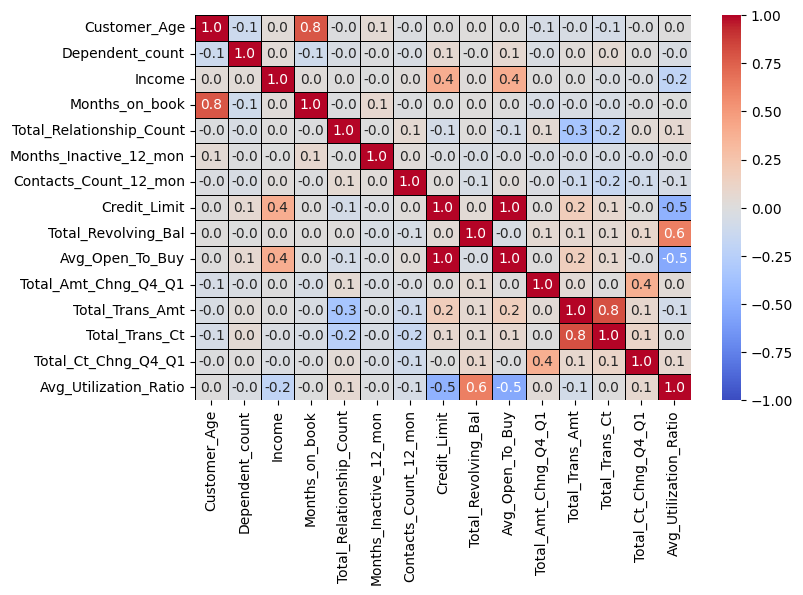

In [89]:
# Calcular la matriz de correlación
corr_matrix = datos.corr(numeric_only=True)
plt.figure(figsize=(8, 5))
sns.heatmap(corr_matrix,
            annot=True,
            fmt = '.1f',
            linewidths=0.5,
            linecolor='black',
            vmin=-1,
            vmax=1,
            cmap='coolwarm')
plt.show()

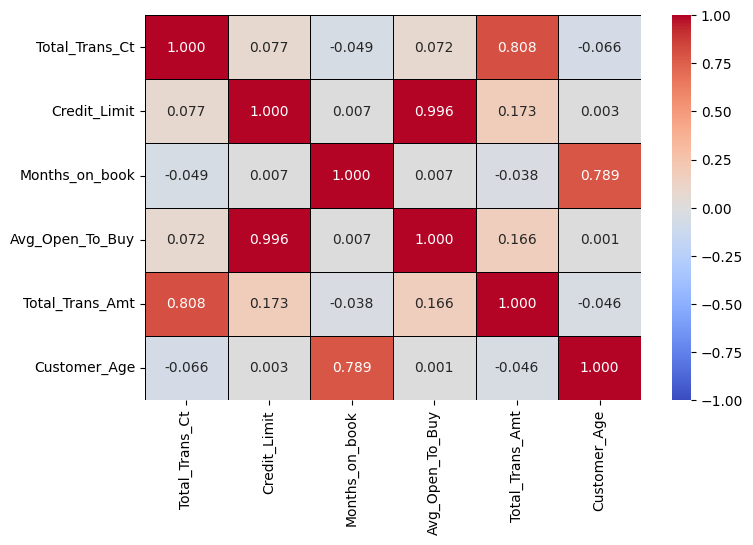

In [90]:
# Matriz de correlación reducida

# Variables que tienen alta correlación
high_corrs = [
              (i, j)
              for i in corr_matrix.columns
              for j in corr_matrix.index
              if (np.abs(corr_matrix.loc[i, j]) >= 0.7) & (i != j)
             ]

# Lista con las variables después del filtro
lista_high_corrs = []
for i in range(len(high_corrs)):
  el_1 = high_corrs[i][0]
  el_2 = high_corrs[i][1]
  lista_high_corrs.extend([el_1, el_2])

# Variables únicas de la lista de variables
vars_high_corrs = list(set(lista_high_corrs))

# Matríz de correlación reducida
small_corr_matrix = datos[vars_high_corrs].corr()

# Heatmap de correlación
plt.figure(figsize=(8, 5))
sns.heatmap(small_corr_matrix,
            annot=True,
            linewidths=0.5,
            linecolor='black',
            vmin=-1,
            vmax=1,
            fmt = '.3f',
            cmap='coolwarm')
plt.show()